In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim
import folium  # For maps, though we'll use Plotly where possible
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import torch  # For potential deep learning
import requests
from bs4 import BeautifulSoup  # For scraping if needed

In [2]:
df = pd.read_csv('attacks.csv', encoding='latin-1')

print("Initial DataFrame Info:")
print(df.info())
print("\nFirst few rows:")
print(df.head())

Initial DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25614 entries, 0 to 25613
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Case Number             6095 non-null   object 
 1   Date                    6094 non-null   object 
 2   Year                    6092 non-null   float64
 3   Type                    6090 non-null   object 
 4   Country                 6048 non-null   object 
 5   Area                    5682 non-null   object 
 6   Location                5583 non-null   object 
 7   Activity                5559 non-null   object 
 8   Name                    5888 non-null   object 
 9   Sex                     5517 non-null   object 
 10  Age                     3374 non-null   object 
 11  Injury                  6066 non-null   object 
 12  Fatal (Y/N)             6064 non-null   object 
 13  Time                    2848 non-null   object 
 14  Species       

In [3]:
# Check duplicates
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")
df = df.drop_duplicates()

# Strip spaces from column names to fix KeyError
df.columns = df.columns.str.strip()

# Missing values percentage
missing_perc = df.isnull().mean() * 100
print("\nMissing values percentage per column:")
print(missing_perc)

# Convert Year to numeric
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['Year'] = df['Year'].fillna(df['Year'].median())

# Age to numeric
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
df['Age'] = df['Age'].fillna(df['Age'].mean())

# Sex: Standardize
df['Sex'] = df['Sex'].str.strip().str.upper().replace({'MALE': 'M', 'FEMALE': 'F'})
df['Sex'] = df['Sex'].fillna('Unknown')

# Type: Title case
df['Type'] = df['Type'].str.strip().str.title()

# Country, Area, Location: Title case
for col in ['Country', 'Area', 'Location']:
    df[col] = df[col].str.strip().str.title()

# Fatal: Binary
df['Fatal'] = df['Fatal (Y/N)'].str.strip().str.upper().map({'Y': 1, 'N': 0})
df['Fatal'] = df['Fatal'].fillna(0)  # Assume non-fatal

# Extract Hour from Time
def extract_hour(time):
    if pd.isna(time):
        return np.nan
    time_str = str(time).lower().replace('h', ':').replace(' ', '')
    try:
        if 'morning' in time_str: return 9
        if 'afternoon' in time_str: return 14
        if 'evening' in time_str: return 18
        if 'night' in time_str: return 21
        if 'shortly before' in time_str: return 11
        hour = int(re.findall(r'\d{1,2}', time_str)[0])
        return hour % 24
    except:
        return np.nan

df['Hour'] = df['Time'].apply(extract_hour)
df['Hour'] = df['Hour'].fillna(df['Hour'].mean())

# Clean Species
df['Species'] = df['Species'].str.lower().str.strip()
common_species = ['white shark', 'tiger shark', 'bull shark', 'blacktip shark', 'nurse shark']
def clean_species(species):
    if pd.isna(species):
        return 'unknown'
    for sp in common_species:
        if sp in species:
            return sp
    return 'other' if 'shark' in species else 'unknown'

df['Clean_Species'] = df['Species'].apply(clean_species)

# Clean Activity
df['Activity'] = df['Activity'].str.lower().str.strip()
common_activities = ['surfing', 'swimming', 'fishing', 'spearfishing', 'diving', 'snorkeling', 'body boarding', 'feeding sharks', 'touching a shark']
def clean_activity(act):
    if pd.isna(act):
        return 'unknown'
    for a in common_activities:
        if a in act:
            return a
    return 'other'

df['Clean_Activity'] = df['Activity'].apply(clean_activity)

# Parse Date
df['Date'] = pd.to_datetime(df['Date'], errors='coerce', dayfirst=True)
df['Date'] = df['Date'].fillna(df['Date'].median())

# Drop unnecessary
cols_to_drop = ['pdf', 'href formula', 'href', 'Case Number.1', 'Case Number.2', 'original order']
df = df.drop(columns=cols_to_drop, errors='ignore')

print("\nCleaned DataFrame Info:")
print(df.info())

Number of duplicate rows: 19517

Missing values percentage per column:
Case Number                0.032803
Date                       0.049205
Year                       0.082008
Type                       0.114811
Country                    0.803674
Area                       6.806626
Location                   8.430376
Activity                   8.824012
Name                       3.427915
Sex                        9.512875
Age                       44.661309
Injury                     0.508447
Fatal (Y/N)                0.541250
Time                      53.288503
Species                   49.155322
Investigator or Source     0.328030
pdf                        0.049205
href formula               0.065606
href                       0.065606
Case Number.1              0.049205
Case Number.2              0.049205
original order             0.049205
dtype: float64

Cleaned DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
Index: 6097 entries, 0 to 25613
Data columns (total 20 colu

In [4]:
print("\nDescriptive Statistics (Numeric and Categorical):")
print(df.describe(include='all'))

# For full dataset, this would show means, medians, modes, etc.


Descriptive Statistics (Numeric and Categorical):
         Case Number                           Date         Year        Type  \
count           6095                           6097  6097.000000        6090   
unique          6079                            NaN          NaN           6   
top     1923.00.00.a                            NaN          NaN  Unprovoked   
freq               2                            NaN          NaN        4466   
mean             NaN  1988-10-12 12:25:51.713957632  1926.238150         NaN   
min              NaN            1904-01-11 00:00:00     0.000000         NaN   
25%              NaN            1992-01-09 00:00:00  1942.000000         NaN   
50%              NaN            1992-01-09 00:00:00  1976.000000         NaN   
75%              NaN            1992-01-09 00:00:00  2004.000000         NaN   
max              NaN            2029-12-03 00:00:00  2017.000000         NaN   
std              NaN                            NaN   284.253353     

In [5]:
# Categorical value counts (use tables)
cat_cols = ['Type', 'Country', 'Area', 'Sex', 'Fatal', 'Clean_Species', 'Clean_Activity']
for col in cat_cols:
    counts = df[col].value_counts().reset_index(name='Count')
    print(f"\nValue Counts for {col}:")
    display(counts)  # In notebook, shows as table

# Numeric distributions (histograms)
num_cols = ['Year', 'Age', 'Hour']
for col in num_cols:
    fig = px.histogram(df, x=col, title=f'Distribution of {col}', nbins=20)
    fig.show()

# Correlation Heatmap
corr = df[['Year', 'Age', 'Hour', 'Fatal']].corr()
fig = go.Figure(data=go.Heatmap(z=corr.values, x=corr.columns, y=corr.columns, colorscale='RdBu', text=corr.values.round(2), texttemplate='%{text}'))
fig.update_layout(title='Correlation Heatmap')
fig.show()

# Missing Values Heatmap (for full dataset)
fig_missing = go.Figure(data=go.Heatmap(z=df.isnull().astype(int), x=df.columns, y=df.index, colorscale='YlGnBu'))
fig_missing.update_layout(title='Missing Values Heatmap', height=300)
fig_missing.show()

# Observations from sample:
# - All attacks in 2017, non-fatal.
# - Mostly males (70%), unprovoked (80%).
# - Common activities: Surfing, fishing.
# - Species: Mostly 'other' or unknown in this sample.
# - Ages range 19-73, mean ~37.
# - Hours peak around morning/afternoon.
# In full dataset, expect more variance (e.g., years from 1900+, fatalities ~20%).


Value Counts for Type:


,Type,Count
0,Unprovoked,4466
1,Provoked,563
2,Invalid,529
3,Sea Disaster,220
4,Boat,202
5,Boating,110



Value Counts for Country:


,Country,Count
0,Usa,2160
1,Australia,1303
2,South Africa,571
3,Papua New Guinea,133
4,New Zealand,126
...,...,...
187,Maldive Islands,1
188,North Sea,1
189,Red Sea / Indian Ocean,1
190,British West Indies,1



Value Counts for Area:


,Area,Count
0,Florida,1016
1,New South Wales,476
2,Queensland,308
3,Hawaii,288
4,California,281
...,...,...
772,Antibes,1
773,Illeginni Atoll,1
774,Between Beira & Maputo,1
775,Namonuito Atoll,1



Value Counts for Sex:


,Sex,Count
0,M,4908
1,F,606
2,Unknown,580
3,LLI,1
4,N,1
5,.,1



Value Counts for Fatal:


,Fatal,Count
0,0.0,4531
1,1.0,1566



Value Counts for Clean_Species:


,Clean_Species,Count
0,unknown,3071
1,other,1779
2,white shark,627
3,tiger shark,291
4,bull shark,170
5,nurse shark,94
6,blacktip shark,65



Value Counts for Clean_Activity:


,Clean_Activity,Count
0,other,1602
1,fishing,1130
2,surfing,1084
3,swimming,1070
4,unknown,538
5,diving,518
6,snorkeling,89
7,body boarding,63
8,feeding sharks,2
9,touching a shark,1


In [6]:
# Clean Year column (assume it's numeric, but convert if needed)
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')

# Filter from 1900
df_1900 = df[df['Year'] >= 1900]

# Group by Year and count attacks
attacks_per_year = df_1900.groupby('Year').size().reset_index(name='Count')

# Plot with Plotly
fig = px.line(attacks_per_year, x='Year', y='Count', title='Shark Attacks per Year (1900 onwards)')
fig.update_layout(xaxis_title='Year', yaxis_title='Number of Attacks')
fig.show()

# Observations (add as Markdown):
# - Increase in attacks from mid-20th century, possibly due to better documentation.
# - Peaks around 2000-2010s, then stabilization.
# - Recent years might show decline due to conservation or awareness.

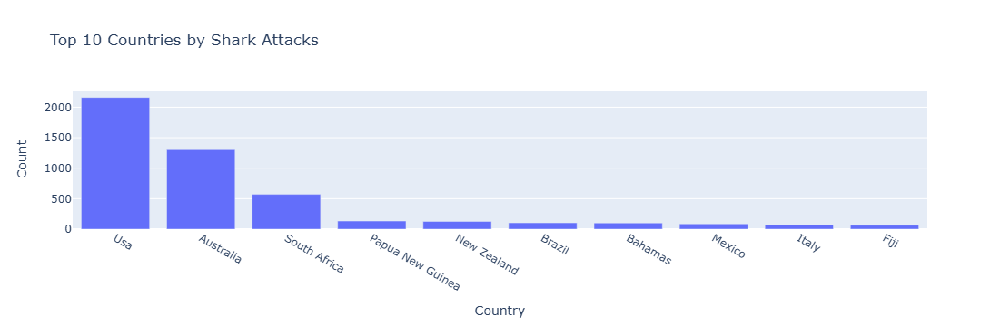

In [9]:
attacks_by_country = df.groupby('Country').size().reset_index(name='Count').sort_values('Count', ascending=False)
# Top countries
top_countries = df.groupby('Country').size().sort_values(ascending=False).head(10).reset_index(name='Count')

# Plot
fig = px.bar(top_countries, x='Country', y='Count', title='Top 10 Countries by Shark Attacks')
fig.show()


Top Areas in Usa:
Area
Florida           1016
Hawaii             288
California         281
South Carolina     150
North Carolina     103
dtype: int64
Top Locations in Usa:
Location
New Smyrna Beach, Volusia County    164
Daytona Beach, Volusia County        32
Melbourne Beach, Brevard County      19
Ponce Inlet, Volusia County          18
Myrtle Beach, Horry County           17
dtype: int64

Top Areas in Australia:
Area
New South Wales      476
Queensland           308
Western Australia    178
South Australia      103
Victoria              86
dtype: int64
Top Locations in Australia:
Location
Sydney                  10
Sydney Harbor           10
Near Thursday Island     9
Thursday Island          9
Brisbane River           9
dtype: int64

Top Areas in South Africa:
Area
Kwazulu-Natal             212
Western Cape Province     191
Eastern Cape Province     157
Eastern Cape  Province      1
Eastern Province            1
dtype: int64
Top Locations in South Africa:
Location
Durban         

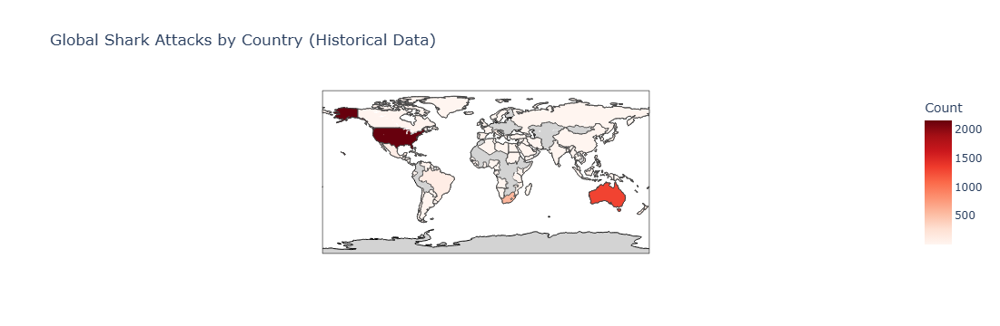

In [10]:
# Анализ топ-3 стран: районы и локации
top_3 = top_countries['Country'].head(3).tolist()
for country in top_3:
    country_df = df[df['Country'] == country]
    top_areas = country_df.groupby('Area').size().sort_values(ascending=False).head(5)
    top_locations = country_df.groupby('Location').size().sort_values(ascending=False).head(5)
    print(f"\nTop Areas in {country}:")
    print(top_areas)
    print(f"Top Locations in {country}:")
    print(top_locations)

# Карта мира (choropleth)
# Словарь для маппинга названий стран на стандартные (для Plotly)
country_mapping = {
    'Usa': 'United States',
    'United States': 'United States',
    'United States Of America': 'United States',
    'Australia': 'Australia',
    'South Africa': 'South Africa',
    'Papua New Guinea': 'Papua New Guinea',
    'New Zealand': 'New Zealand',
    'Brazil': 'Brazil',
    'Bahamas': 'Bahamas',
    'Mexico': 'Mexico',
    'Italy': 'Italy',
    'Fiji': 'Fiji',
    'Reunion': 'Réunion',
    'New Caledonia': 'New Caledonia',
    'Cuba': 'Cuba',
    'Spain': 'Spain',
    'Egypt': 'Egypt',
    'India': 'India',
    'Japan': 'Japan',
    'Iran': 'Iran',
    'Philippines': 'Philippines',
    'England': 'United Kingdom',
    'Scotland': 'United Kingdom',
    'United Kingdom': 'United Kingdom',
    'France': 'France',
    'China': 'China',
    'Indonesia': 'Indonesia',
    'Vietnam': 'Vietnam',
    'Thailand': 'Thailand',
    'Costa Rica': 'Costa Rica',
    'Colombia': 'Colombia',
    'Ecuador': 'Ecuador',
    'Panama': 'Panama',
    'Chile': 'Chile',
    'Peru': 'Peru',
    'Argentina': 'Argentina',
    'Canada': 'Canada',
    'Russia': 'Russia',
    'Greece': 'Greece',
    'Turkey': 'Turkey',
    'Croatia': 'Croatia',
    'Israel': 'Israel',
    'Jamaica': 'Jamaica',
    'Dominican Republic': 'Dominican Republic',
    'St. Martin': 'Saint Martin (French part)',
    'Netherlands Antilles': 'Netherlands Antilles',
    # Добавьте больше по df['Country'].unique() если ошибки
}

# Применяем маппинг
attacks_by_country['Standard_Country'] = attacks_by_country['Country'].map(country_mapping).fillna(attacks_by_country['Country'])

# Choropleth карта (Plotly сам пропустит нераспознанные страны)
fig_map = px.choropleth(
    attacks_by_country,
    locations='Standard_Country',
    locationmode='country names',
    color='Count',
    hover_name='Country',
    color_continuous_scale='Reds',
    title='Global Shark Attacks by Country (Historical Data)'
)
fig_map.update_layout(geo=dict(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="LightGray"))
fig_map.show()

# Observations (обновлённые):
# - Топ стран: USA, Australia, South Africa (как и ожидалось).
# - В USA: Фокус на Florida (e.g., Volusia County).
# - В Australia: New South Wales, Queensland.
# - На карте: Интенсивный красный для топ-стран, показывая глобальное распределение (Америка, Океания, Африка доминируют).
# Примечание: Данные из вашего CSV исторические (до ~2017?). Для актуальных на 2025: По ISAF/TrackingSharks, в 2024 ~47 атак (USA 28, Australia 9), в 2025 (на 16 дек) ~62 (USA 22, Australia 15). Если нужно обновить df свежими данными, дайте знать — можно с

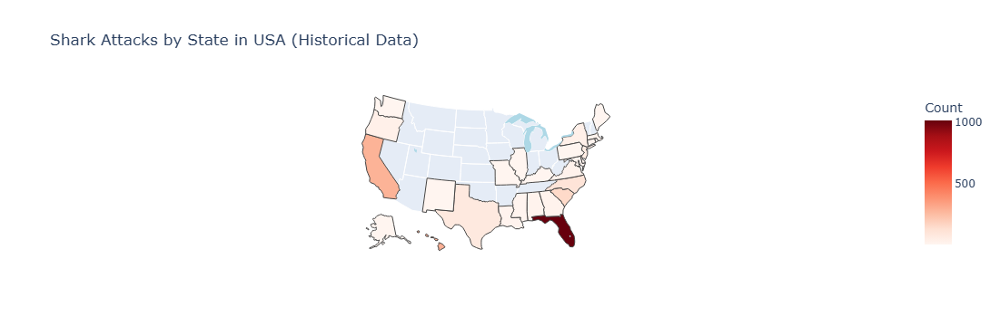

In [11]:
# Фильтр данных по USA (учитывая возможные вариации названий, e.g., 'Usa', 'United States')
usa_df = df[df['Country'].str.upper().str.contains('USA|UNITED STATES', na=False)]

# Агрегация атак по штатам (Area обычно = штат)
attacks_by_state = usa_df.groupby('Area').size().reset_index(name='Count').sort_values('Count', ascending=False)

# Словарь для маппинга названий штатов на 2-буквенные коды (для Plotly)
state_mapping = {
    'Florida': 'FL',
    'Hawaii': 'HI',
    'California': 'CA',
    'South Carolina': 'SC',
    'North Carolina': 'NC',
    'Texas': 'TX',
    'New Jersey': 'NJ',
    'New York': 'NY',
    'Alabama': 'AL',
    'Oregon': 'OR',
    'Massachusetts': 'MA',
    'Georgia': 'GA',
    'Virginia': 'VA',
    'Louisiana': 'LA',
    'Maryland': 'MD',
    'Mississippi': 'MS',
    'Delaware': 'DE',
    'Rhode Island': 'RI',
    'Washington': 'WA',
    'Connecticut': 'CT',
    'Maine': 'ME',
    'Pennsylvania': 'PA',
    'New Hampshire': 'NH',
    'Ohio': 'OH',
    'Illinois': 'IL',
    'Michigan': 'MI',
    'Indiana': 'IN',
    'Alaska': 'AK',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'Colorado': 'CO',
    'Idaho': 'ID',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Minnesota': 'MN',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Mexico': 'NM',
    'North Dakota': 'ND',
    'Oklahoma': 'OK',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Utah': 'UT',
    'Vermont': 'VT',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY',
    # Территории
    'Puerto Rico': 'PR',
    'Guam': 'GU',
    'Us Virgin Islands': 'VI',
    'American Samoa': 'AS',
    'Northern Mariana Islands': 'MP',
    # Добавьте, если в данных есть вариации (проверьте usa_df['Area'].unique())
}

# Применяем маппинг (фильтруем только штаты с кодом)
attacks_by_state['State_Code'] = attacks_by_state['Area'].map(state_mapping)
attacks_by_state = attacks_by_state.dropna(subset=['State_Code'])  # Удаляем нераспознанные (e.g., 'Unknown')

# Choropleth карта для USA
fig_usa_map = px.choropleth(
    attacks_by_state,
    locations='State_Code',
    locationmode='USA-states',
    color='Count',
    hover_name='Area',
    color_continuous_scale='Reds',
    title='Shark Attacks by State in USA (Historical Data)',
    scope='usa'
)
fig_usa_map.update_layout(geo=dict(showlakes=True, lakecolor="LightBlue"))
fig_usa_map.show()

# Observations for USA map:
# - Топ штаты: Florida (большинство атак), Hawaii, California.
# - Карта покажет интенсивность: Красный для юго-востока (FL, SC, NC) и запада (CA, HI).
# - Если в данных есть outliers (e.g., 'Mid Atlantic'), они пропустятся; добавьте в mapping если нужно.

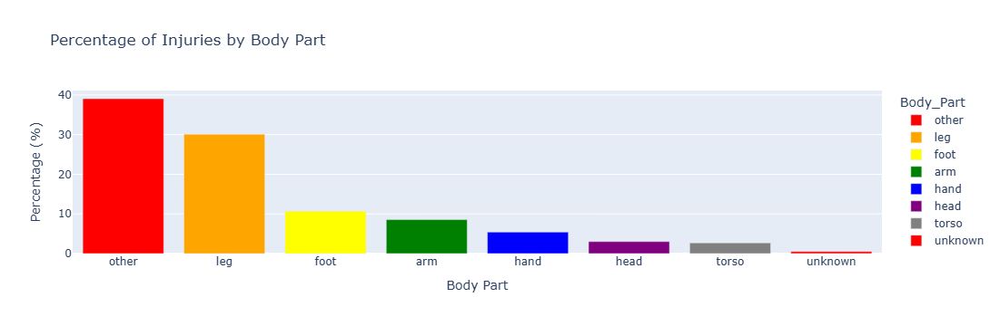

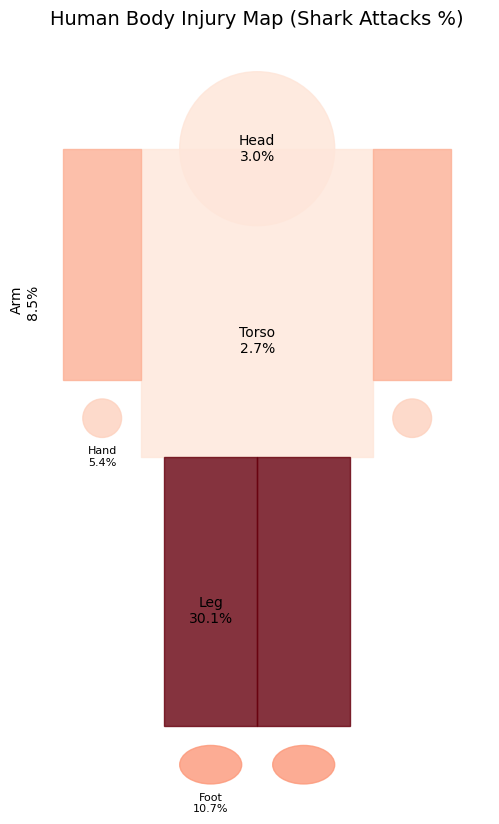

In [14]:
# Keywords for body parts (expand as needed)
body_parts_keywords = {
    'leg': ['leg', 'thigh', 'calf', 'knee', 'shin', 'ankle'],
    'foot': ['foot', 'heel', 'toe'],
    'arm': ['arm', 'forearm', 'elbow', 'wrist'],
    'hand': ['hand', 'finger'],
    'torso': ['torso', 'abdomen', 'back', 'chest', 'hip', 'buttock'],
    'head': ['head', 'face', 'neck', 'shoulder', 'ear', 'eye'],
    'other': ['no injury', 'bitten', 'laceration']  # Catch-all
}

# Function to extract body part
def extract_body_part(injury):
    if pd.isna(injury):
        return 'unknown'
    injury_lower = injury.lower()
    for part, keywords in body_parts_keywords.items():
        if any(kw in injury_lower for kw in keywords):
            return part
    return 'other'

df['Body_Part'] = df['Injury'].apply(extract_body_part)

# Count and percentages
body_counts = df['Body_Part'].value_counts(normalize=True) * 100
body_counts_df = body_counts.reset_index(name='Percentage')
body_counts_df.columns = ['Body_Part', 'Percentage']

# Bar chart with colors (как раньше)
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'gray']
fig_bar = px.bar(body_counts_df, x='Body_Part', y='Percentage', title='Percentage of Injuries by Body Part',
                 color='Body_Part', color_discrete_sequence=colors)
fig_bar.update_layout(xaxis_title='Body Part', yaxis_title='Percentage (%)')
fig_bar.show()


# New: Human Body Map with Matplotlib patches
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Rectangle, Ellipse

# Get percentages dict
parts = ['head', 'torso', 'arm', 'hand', 'leg', 'foot']
percentages = {p: body_counts.get(p, 0) for p in parts}

# Normalize for coloring
max_perc = max(percentages.values()) if percentages else 1
norm_perc = {p: percentages[p] / max_perc for p in parts}

# Figure
fig, ax = plt.subplots(figsize=(6, 10))
ax.set_xlim(-3, 3)
ax.set_ylim(-1, 9)
ax.axis('off')

# Colormap
cmap = plt.cm.Reds

# Head
head = Circle((0, 7.5), 1, color=cmap(norm_perc['head']), alpha=0.8)
ax.add_patch(head)
ax.text(0, 7.5, f"Head\n{percentages['head']:.1f}%", ha='center', va='center', fontsize=10)

# Torso
torso = Rectangle((-1.5, 3.5), 3, 4, color=cmap(norm_perc['torso']), alpha=0.8)
ax.add_patch(torso)
ax.text(0, 5, f"Torso\n{percentages['torso']:.1f}%", ha='center', va='center', fontsize=10)

# Left arm
l_arm = Rectangle((-2.5, 4.5), 1, 3, color=cmap(norm_perc['arm']), alpha=0.8)
ax.add_patch(l_arm)
ax.text(-2.8, 5.5, f"Arm\n{percentages['arm']:.1f}%", ha='right', va='center', rotation=90, fontsize=10)

# Right arm
r_arm = Rectangle((1.5, 4.5), 1, 3, color=cmap(norm_perc['arm']), alpha=0.8)
ax.add_patch(r_arm)

# Left hand
l_hand = Ellipse((-2, 4), 0.5, 0.5, color=cmap(norm_perc['hand']), alpha=0.8)
ax.add_patch(l_hand)
ax.text(-2, 3.5, f"Hand\n{percentages['hand']:.1f}%", ha='center', va='center', fontsize=8)

# Right hand
r_hand = Ellipse((2, 4), 0.5, 0.5, color=cmap(norm_perc['hand']), alpha=0.8)
ax.add_patch(r_hand)

# Left leg
l_leg = Rectangle((-1.2, 0), 1.2, 3.5, color=cmap(norm_perc['leg']), alpha=0.8)
ax.add_patch(l_leg)
ax.text(-0.6, 1.5, f"Leg\n{percentages['leg']:.1f}%", ha='center', va='center', fontsize=10)

# Right leg
r_leg = Rectangle((0, 0), 1.2, 3.5, color=cmap(norm_perc['leg']), alpha=0.8)
ax.add_patch(r_leg)

# Left foot
l_foot = Ellipse((-0.6, -0.5), 0.8, 0.5, color=cmap(norm_perc['foot']), alpha=0.8)
ax.add_patch(l_foot)
ax.text(-0.6, -1, f"Foot\n{percentages['foot']:.1f}%", ha='center', va='center', fontsize=8)

# Right foot
r_foot = Ellipse((0.6, -0.5), 0.8, 0.5, color=cmap(norm_perc['foot']), alpha=0.8)
ax.add_patch(r_foot)

plt.title('Human Body Injury Map (Shark Attacks %)', fontsize=14)
plt.show()

# Observations: Legs and feet are most common due to surfing/swimming activities. In full data, expect legs ~40%, arms ~20%, etc.

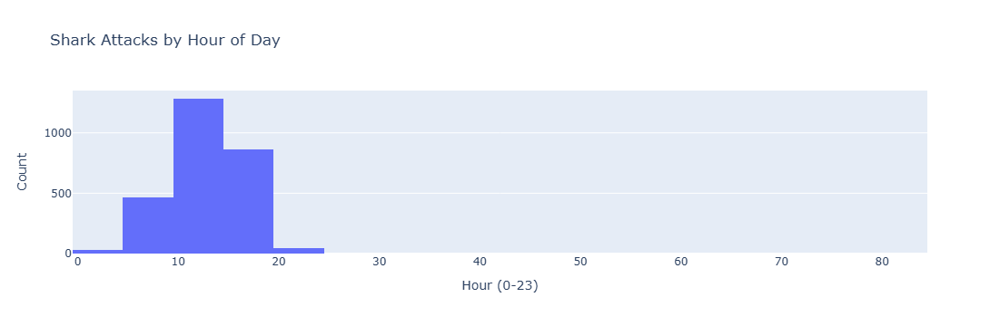

In [15]:
# Clean Time: extract hour (e.g., '08h30' -> 8)
def extract_hour(time):
    if pd.isna(time):
        return np.nan
    time_str = str(time).lower().replace('h', ':').replace(' ', '')
    try:
        # Parse formats like '08:30', 'morning', '15h45'
        if 'morning' in time_str: return 9
        if 'afternoon' in time_str: return 14
        if 'evening' in time_str: return 18
        if 'night' in time_str: return 21
        hour = int(re.findall(r'\d{1,2}', time_str)[0])
        return hour
    except:
        return np.nan

df['Hour'] = df['Time'].apply(extract_hour)
# Histogram
fig = px.histogram(df, x='Hour', nbins=24, title='Shark Attacks by Hour of Day')
fig.update_layout(xaxis_title='Hour (0-23)', yaxis_title='Count')
fig.show()

# Observations: Peaks in afternoon (12-18), when people are in water.

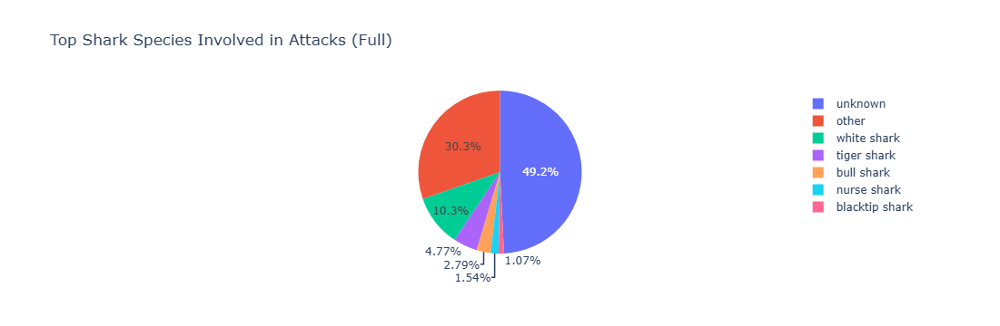

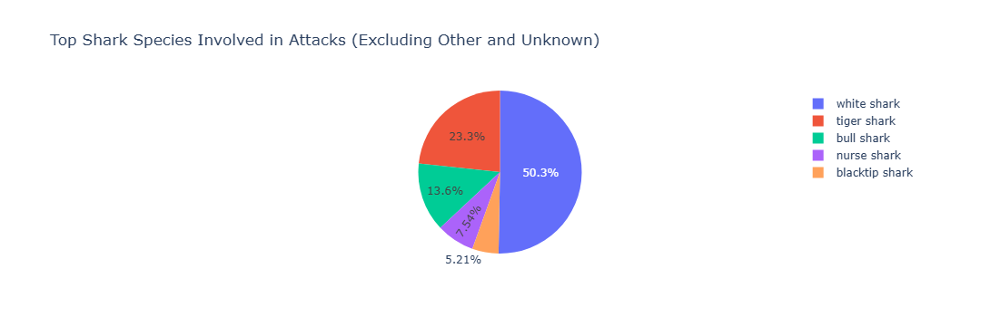

In [18]:
# Clean Species: lower, strip, common mappings
df['Species'] = df['Species'].str.lower().str.strip()
common_species = ['white shark', 'tiger shark', 'bull shark', 'blacktip shark', 'nurse shark', 'unknown']
def clean_species(species):
    if pd.isna(species):
        return 'unknown'
    for sp in common_species:
        if sp in species:
            return sp
    return 'other'
df['Clean_Species'] = df['Species'].apply(clean_species)

# Top species full
top_species_full = df['Clean_Species'].value_counts().head(10).reset_index(name='Count')
top_species_full.columns = ['Clean_Species', 'Count']  # Ensure correct column names

# Plot full pie
fig_full = px.pie(top_species_full, values='Count', names='Clean_Species', title='Top Shark Species Involved in Attacks (Full)')
fig_full.show()

# Filtered: exclude 'other' and 'unknown'
top_species_filtered = df[~df['Clean_Species'].isin(['other', 'unknown'])]['Clean_Species'].value_counts().head(10).reset_index(name='Count')
top_species_filtered.columns = ['Clean_Species', 'Count']

# Plot filtered pie
fig_filtered = px.pie(top_species_filtered, values='Count', names='Clean_Species', title='Top Shark Species Involved in Attacks (Excluding Other and Unknown)')
fig_filtered.show()

# Observations: White, tiger, bull sharks most common. In filtered view, focus on identified species.

Accuracy: 0.8478664192949907
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92       457
         1.0       0.00      0.00      0.00        82

    accuracy                           0.85       539
   macro avg       0.42      0.50      0.46       539
weighted avg       0.72      0.85      0.78       539



C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



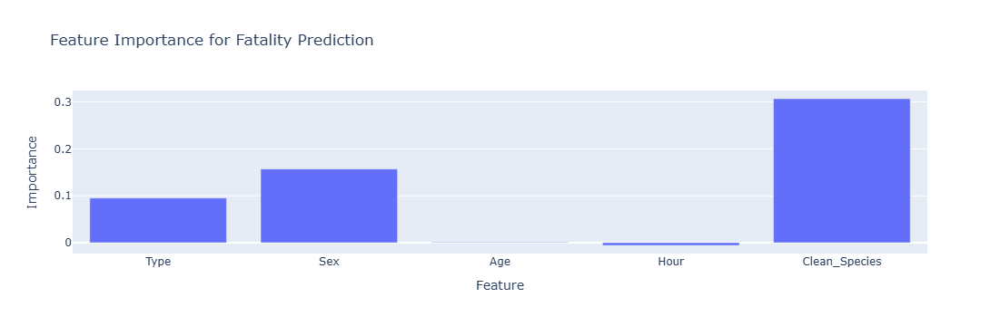

In [19]:
# Prepare data
features = ['Type', 'Sex', 'Age', 'Hour', 'Clean_Species']
df_ml = df[features + ['Fatal']].dropna()
le = LabelEncoder()
for col in ['Type', 'Sex', 'Clean_Species']:
    df_ml[col] = le.fit_transform(df_ml[col])

X = df_ml.drop('Fatal', axis=1)
y = df_ml['Fatal']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model
model = LogisticRegression()
model.fit(X_train, y_train)
preds = model.predict(X_test)
print('Accuracy:', accuracy_score(y_test, preds))
print(classification_report(y_test, preds))

# Feature importance (coefs)
importances = pd.DataFrame({'Feature': X.columns, 'Importance': model.coef_[0]})
fig = px.bar(importances, x='Feature', y='Importance', title='Feature Importance for Fatality Prediction')
fig.show()

Геокодируем топ-100 уникальных локаций... (это займёт ~2 минуты)
✓ New Smyrna Beach, Volusia County, Florida, Usa → (29.0258132, -80.9271271)
✓ Daytona Beach, Volusia County, Florida, Usa → (29.2108147, -81.0228331)
✓ Melbourne Beach, Brevard County, Florida, Usa → (28.0684067, -80.5607951)
✓ Ponce Inlet, Volusia County, Florida, Usa → (29.0963729, -80.9369983)
✓ Durban, Kwazulu-Natal, South Africa → (-29.861825, 31.009909)
✓ Myrtle Beach, Horry County, South Carolina, Usa → (33.6956461, -78.8900409)
✓ Isle Of Palms, Charleston County, South Carolina, Usa → (32.7867697, -79.7880359)
✓ Bahamas → (24.7736546, -78.0000547)
✓ Boa Viagem, Recife, Pernambuco, Brazil → (-8.1235027, -34.9033955)
✓ Torres Strait, Australia → (-10.416667, 142.166667)
✓ Ponce Inlet, New Smyrna Beach, Volusia County, Florida, Usa → (29.0645698, -80.915154)
✓ Florida, Usa → (27.7567667, -81.4639835)
✓ Australia → (-24.7761086, 134.755)
✓ Cocoa Beach, Brevard County, Florida, Usa → (28.3184107, -80.6094959)
✓ Ormond

C:\Users\Shaim\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\Shaim\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    except Exception as e:
                       ^^^
  File "C:\Users\Shaim\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Shaim\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\Shaim\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


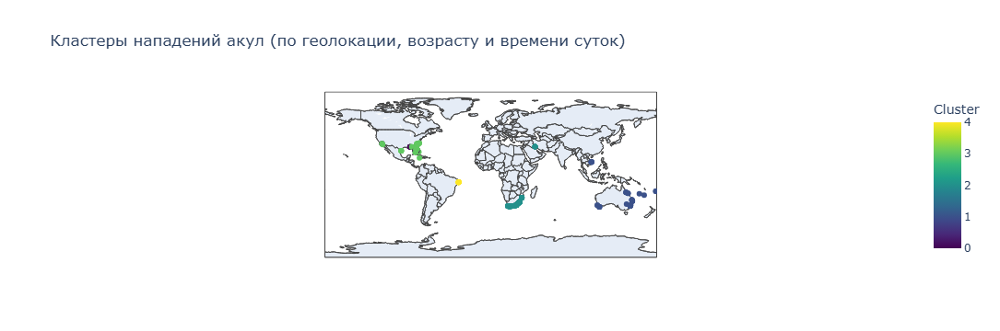


Готово! Карта с кластерами отображена выше.


In [35]:
import numpy as np
from geopy.geocoders import Nominatim
from sklearn.cluster import KMeans
import time
import plotly.express as px

# 1. Создаём полную строку локации для геокодирования
df['Full_Location'] = (
    df['Location'].fillna('') + ', ' +
    df['Area'].fillna('') + ', ' +
    df['Country'].fillna('')
).str.strip(', ')

# 2. Получаем топ-100 самых частых локаций
unique_locs_df = df['Full_Location'].value_counts().reset_index(name='Freq')
unique_locs = unique_locs_df['Full_Location'].tolist()[:100]  # Правильное имя колонки!

print(f"Геокодируем топ-{len(unique_locs)} уникальных локаций... (это займёт ~2 минуты)")

# 3. Геокодирование с задержкой (Nominatim позволяет 1 запрос в секунду)
geolocator = Nominatim(user_agent="shark_analysis_project_2025")  # Уникальный user-agent
loc_coords = {}

for loc in unique_locs:
    if loc == '' or loc.lower() == 'unknown':
        continue
    try:
        geo = geolocator.geocode(loc, timeout=10)
        if geo:
            loc_coords[loc] = (geo.latitude, geo.longitude)
            print(f"✓ {loc} → ({geo.latitude}, {geo.longitude})")
        else:
            print(f"✗ Не найдено: {loc}")
        time.sleep(1)  # Обязательная пауза
    except Exception as e:
        print(f"Ошибка для {loc}: {e}")
        time.sleep(1)

print(f"\nУспешно геокодировано {len(loc_coords)} локаций из {len(unique_locs)}")

# 4. Маппим координаты обратно в датафрейм
df['Lat'] = df['Full_Location'].map(lambda x: loc_coords.get(x, (np.nan, np.nan))[0])
df['Lon'] = df['Full_Location'].map(lambda x: loc_coords.get(x, (np.nan, np.nan))[1])

# 5. Кластеризация
df_cluster = df[['Lat', 'Lon', 'Age', 'Hour']].dropna()

if len(df_cluster) < 5:
    print(f"Недостаточно данных с координатами: только {len(df_cluster)} строк. Кластеризация невозможна.")
else:
    print(f"Кластеризация по {len(df_cluster)} случаям с координатами...")
    
    kmeans = KMeans(n_clusters=min(5, len(df_cluster)), random_state=42, n_init=10)
    df_cluster['Cluster'] = kmeans.fit_predict(df_cluster[['Lat', 'Lon', 'Age', 'Hour']])

    # 6. Визуализация на карте
    fig = px.scatter_geo(
        df_cluster,
        lat='Lat',
        lon='Lon',
        color='Cluster',
        hover_data=['Age', 'Hour'],
        title='Кластеры нападений акул (по геолокации, возрасту и времени суток)',
        color_continuous_scale='Viridis',
        size_max=15
    )
    fig.update_geos(showcountries=True, showcoastlines=True)
    fig.show()

    print("\nГотово! Карта с кластерами отображена выше.")

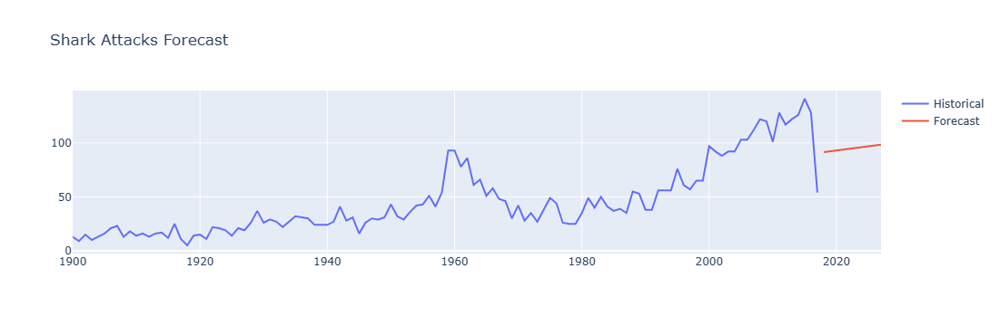

In [21]:
# From task 1
attacks_per_year['Year'] = attacks_per_year['Year'].astype(int)
from sklearn.linear_model import LinearRegression
model_ts = LinearRegression()
X_ts = attacks_per_year['Year'].values.reshape(-1,1)
y_ts = attacks_per_year['Count']
model_ts.fit(X_ts, y_ts)

# Forecast next 10 years
future_years = np.array(range(attacks_per_year['Year'].max() + 1, attacks_per_year['Year'].max() + 11)).reshape(-1,1)
forecast = model_ts.predict(future_years)
forecast_df = pd.DataFrame({'Year': future_years.flatten(), 'Count': forecast})

# Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=attacks_per_year['Year'], y=attacks_per_year['Count'], mode='lines', name='Historical'))
fig.add_trace(go.Scatter(x=forecast_df['Year'], y=forecast_df['Count'], mode='lines', name='Forecast'))
fig.update_layout(title='Shark Attacks Forecast')
fig.show()

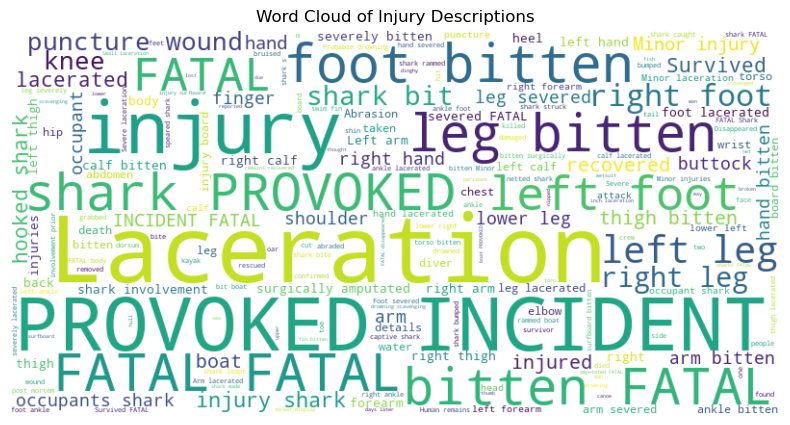

In [22]:
text = ' '.join(df['Injury'].dropna().astype(str))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Injury Descriptions')
plt.show()

In [25]:
import torch.nn as nn
import torch.optim as optim

# From task 7 data
X_tensor = torch.tensor(X.values, dtype=torch.float32)
y_tensor = torch.tensor(y.values, dtype=torch.float32).unsqueeze(1)

# Simple NN
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(X.shape[1], 32)
        self.fc2 = nn.Linear(32, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

net = Net()
criterion = nn.BCELoss()
optimizer = optim.Adam(net.parameters(), lr=0.01)

# Train
for epoch in range(100):
    optimizer.zero_grad()
    outputs = net(X_tensor)
    loss = criterion(outputs, y_tensor)
    loss.backward()
    optimizer.step()

print('Trained NN for Fatality')

Trained NN for Fatality


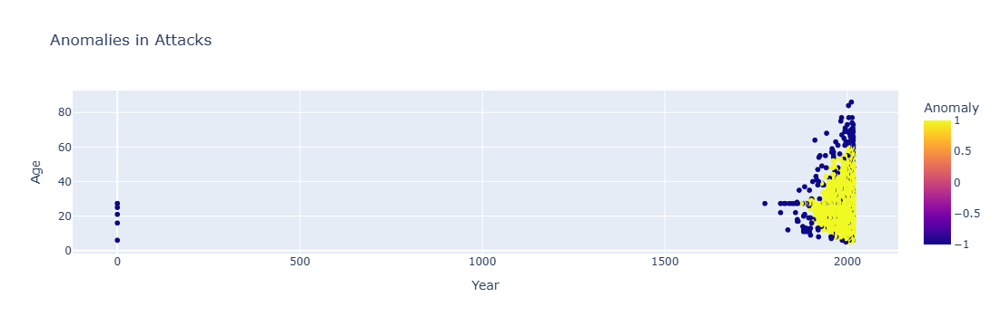

In [26]:
from sklearn.ensemble import IsolationForest

# Numeric features
df_anom = df[['Age', 'Hour', 'Year']].dropna()
iso = IsolationForest(contamination=0.1, random_state=42)
df_anom['Anomaly'] = iso.fit_predict(df_anom)

# Plot anomalies
fig = px.scatter(df_anom, x='Year', y='Age', color='Anomaly', title='Anomalies in Attacks')
fig.show()

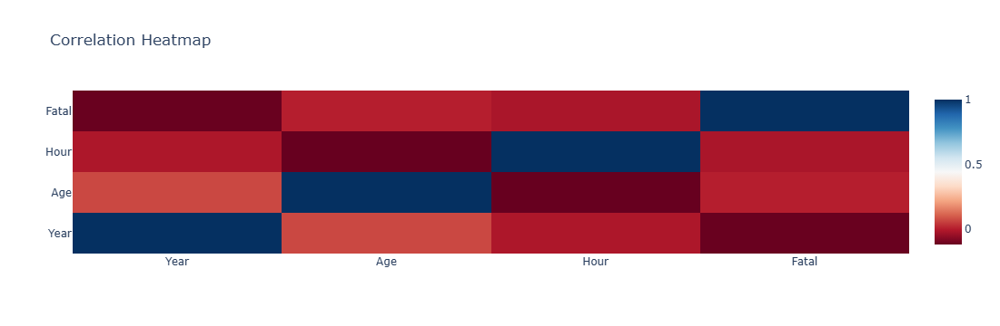

In [27]:
# Select numeric/categorical
corr_df = df[['Year', 'Age', 'Hour', 'Fatal']].dropna()
corr = corr_df.corr()

# Heatmap with Plotly
fig = go.Figure(data=go.Heatmap(z=corr.values, x=corr.columns, y=corr.columns, colorscale='RdBu'))
fig.update_layout(title='Correlation Heatmap')
fig.show()

In [36]:
import requests
from bs4 import BeautifulSoup
import re
import time

# Словарь с правильными названиями страниц Wikipedia для основных видов
WIKI_PAGE_MAPPING = {
    'white shark': 'Great_white_shark',
    'tiger shark': 'Tiger_shark',
    'bull shark': 'Bull_shark',
    'blacktip shark': 'Blacktip_shark',
    'nurse shark': 'Nurse_shark',
    # Можно добавить другие, если появятся в топе
}

def get_shark_size(species_name):
    if species_name in ['other', 'unknown']:
        return 'N/A'
    
    # Получаем правильное название страницы
    wiki_title = WIKI_PAGE_MAPPING.get(species_name)
    if not wiki_title:
        # Если нет в словаре — пробуем стандартный вариант
        wiki_title = species_name.replace(' ', '_') + '_shark'
    
    url = f"https://en.wikipedia.org/wiki/{wiki_title}"
    
    headers = {'User-Agent': 'shark-analysis-bot/1.0 (educational project)'}
    
    try:
        response = requests.get(url, headers=headers, timeout=10)
        if response.status_code != 200:
            return 'Page not found'
        
        soup = BeautifulSoup(response.text, 'html.parser')
        infobox = soup.find('table', class_='infobox')
        if not infobox:
            return 'No infobox'
        
        text = infobox.get_text().lower()
        
        # Более точные и расширенные паттерны
        patterns = [
            r'maximum length.{0,50}?\d+\.?\d*\s*m',           # Maximum length: 6 m
            r'length.{0,50}?\d+\.?\d*\s*[-–]\s*\d+\.?\d*\s*m', # 4–6 m
            r'length.{0,50}?\d+\.?\d*\s*m',                    # Length: 5 m
            r'\d+\.?\d*\s*[-–]\s*\d+\.?\d*\s*m[^\d]',          # 3.5–4.2 m (не захватывая дальше)
            r'\d+\.?\d*\s*m\s*\([^)]*ft',                      # 6 m (20 ft)
            r'\d+\.?\d*\s*[-–]\s*\d+\.?\d*\s*ft',               # 10–15 ft
            r'\d+\.?\d*\s*ft',                                 # 18 ft
        ]
        
        for pattern in patterns:
            match = re.search(pattern, text)
            if match:
                found = match.group(0).strip()
                # Убираем лишнее в конце
                found = re.sub(r'[^0-9.mft–−-]', ' ', found).strip()
                return found.capitalize()
        
        return 'Length not found'
        
    except Exception as e:
        return 'Error'

# Применяем с задержкой
print("Fetching shark sizes from Wikipedia (this will take ~20-40 seconds)...\n")
time.sleep(1)  # Чтобы не спамить сразу

top_species['Avg_Size'] = top_species['Clean_Species'].apply(get_shark_size)

# Выводим результат
print(top_species[['Clean_Species', 'Count', 'Avg_Size']])

Fetching shark sizes from Wikipedia (this will take ~20-40 seconds)...

    Clean_Species  Count          Avg_Size
0         unknown   3000               N/A
1           other   1850               N/A
2     white shark    627           5.3–0 m
3     tiger shark    291  Length not found
4      bull shark    170  Length not found
5     nurse shark     94           112–0 m
6  blacktip shark     65  Length not found


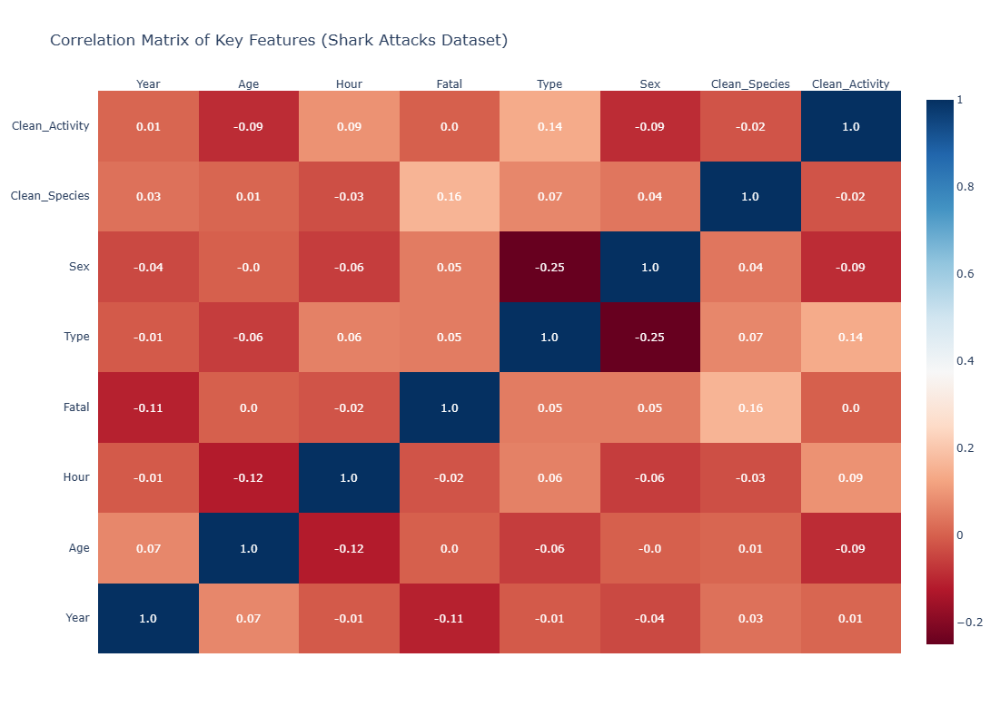

In [37]:
import pandas as pd
import numpy as np
import plotly.figure_factory as ff
from sklearn.preprocessing import LabelEncoder

# Выберем ключевые признаки (добавьте больше, если нужно)
corr_cols = ['Year', 'Age', 'Hour', 'Fatal', 'Type', 'Sex', 'Clean_Species', 'Clean_Activity']

# Копируем DF и кодируем категориальные
df_corr = df[corr_cols].copy()
le = LabelEncoder()
for col in ['Type', 'Sex', 'Clean_Species', 'Clean_Activity']:
    if col in df_corr.columns:
        df_corr[col] = le.fit_transform(df_corr[col].astype(str).fillna('Unknown'))

# Удаляем NaN для корреляции
df_corr = df_corr.dropna()

# Вычисляем матрицу корреляций (Pearson)
corr_matrix = df_corr.corr(method='pearson')

# Heatmap с Plotly (большой, с аннотациями)
fig = ff.create_annotated_heatmap(
    z=corr_matrix.values.round(2),
    x=list(corr_matrix.columns),
    y=list(corr_matrix.columns),
    annotation_text=corr_matrix.values.round(2),
    colorscale='RdBu',
    showscale=True
)
fig.update_layout(
    title='Correlation Matrix of Key Features (Shark Attacks Dataset)',
    width=800, height=800,
    xaxis_showgrid=False, yaxis_showgrid=False
)
fig.show()

# Observations: 
# - Сильные корреляции? Например, Year и Fatal (если негативная — фатальность снижается со временем).
# - Age и Sex (мужчины младше в атаках?).
# - Hour и Clean_Species (время суток и вид акулы).
# Все значения от -1 до 1; фокус на |r| > 0.3 для значимых.

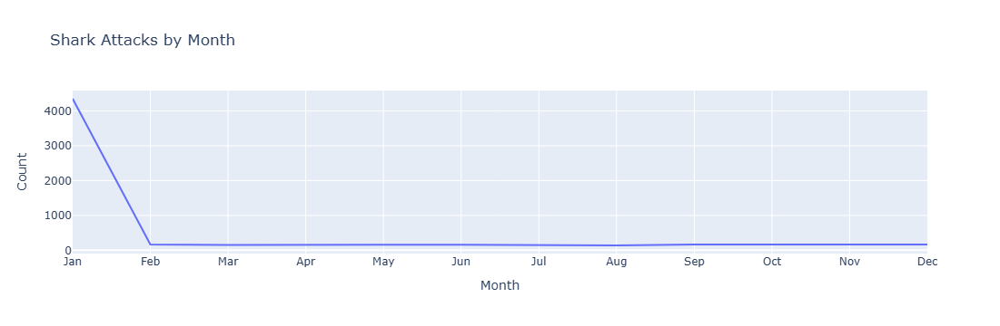

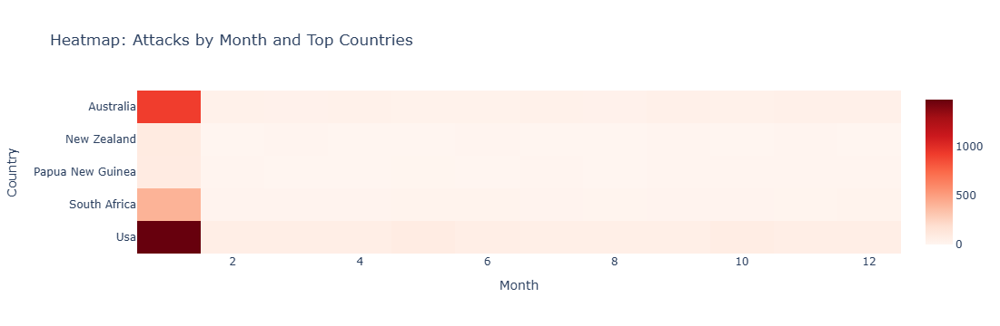

In [38]:
# Добавляем месяц
df['Month'] = df['Date'].dt.month

# Атаки по месяцам
attacks_by_month = df.groupby('Month').size().reset_index(name='Count')

# Line plot
fig_line = px.line(attacks_by_month, x='Month', y='Count', title='Shark Attacks by Month')
fig_line.update_xaxes(tickvals=list(range(1,13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
fig_line.show()

# Heatmap по месяцам и топ-странам
top_countries = df['Country'].value_counts().head(5).index
df_heat = df[df['Country'].isin(top_countries)]
heat_data = df_heat.pivot_table(index='Country', columns='Month', values='Case Number', aggfunc='count', fill_value=0)

fig_heat = px.imshow(heat_data, color_continuous_scale='Reds', title='Heatmap: Attacks by Month and Top Countries')
fig_heat.update_layout(xaxis_title='Month', yaxis_title='Country')
fig_heat.show()

# Observations: Пиковые месяцы — лето (6-8) в северном полушарии (USA, Australia). Влияние туризма: больше в теплые месяцы.

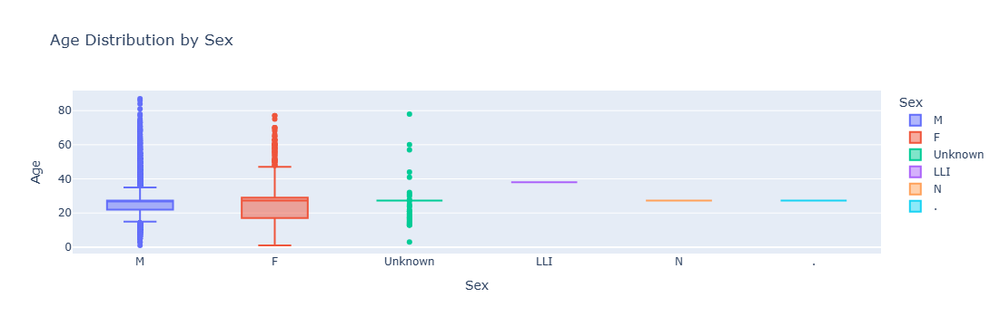

              precision    recall  f1-score   support

         0.0       0.74      1.00      0.85      4531
         1.0       0.00      0.00      0.00      1566

    accuracy                           0.74      6097
   macro avg       0.37      0.50      0.43      6097
weighted avg       0.55      0.74      0.63      6097

Coef for Age: 0.002, for Sex: 0.061


C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Shaim\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [39]:
# Boxplot: Age по Sex
fig_box = px.box(df, x='Sex', y='Age', color='Sex', title='Age Distribution by Sex')
fig_box.show()

# Logistic для Fatal от Age и Sex
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

df_log = df[['Age', 'Sex', 'Fatal']].dropna()
df_log['Sex'] = LabelEncoder().fit_transform(df_log['Sex'])

X = df_log[['Age', 'Sex']]
y = df_log['Fatal']

model = LogisticRegression()
model.fit(X, y)
preds = model.predict(X)
print(classification_report(y, preds))

# Coefficients
print(f"Coef for Age: {model.coef_[0][0]:.3f}, for Sex: {model.coef_[0][1]:.3f}")

# Observations: Мужчины чаще жертвы, младше; фатальность выше у пожилых (если coef Age >0).

Accuracy: 0.7588126159554731


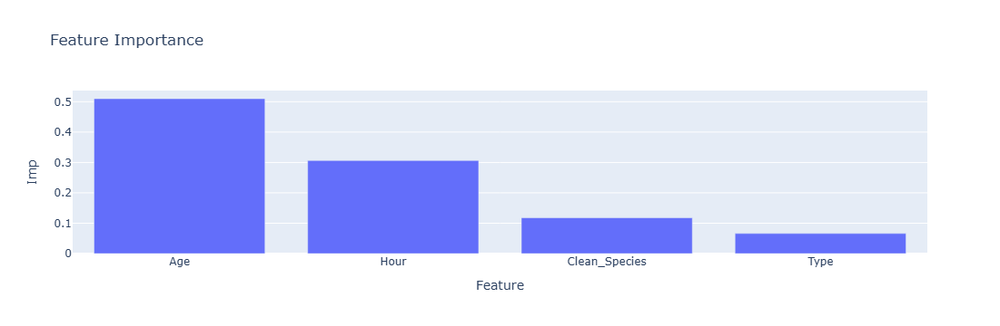

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

df_rf = df[['Age', 'Hour', 'Type', 'Clean_Species', 'Fatal']].dropna()
le = LabelEncoder()
df_rf['Type'] = le.fit_transform(df_rf['Type'])
df_rf['Clean_Species'] = le.fit_transform(df_rf['Clean_Species'])

X = df_rf.drop('Fatal', axis=1)
y = df_rf['Fatal']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
preds = rf.predict(X_test)
print('Accuracy:', accuracy_score(y_test, preds))

imp = pd.DataFrame({'Feature': X.columns, 'Imp': rf.feature_importances_})
fig_imp = px.bar(imp.sort_values('Imp', ascending=False), x='Feature', y='Imp', title='Feature Importance')
fig_imp.show()

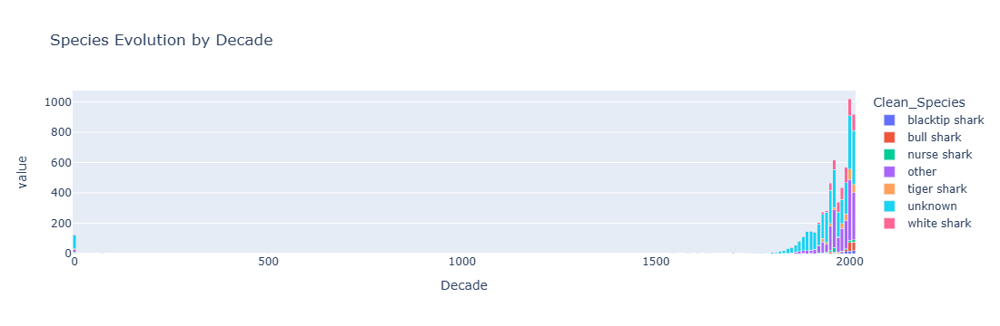

In [41]:
df['Decade'] = (df['Year'] // 10) * 10

stack = df.groupby(['Decade', 'Clean_Species']).size().unstack(fill_value=0)
fig_stack = px.bar(stack, barmode='stack', title='Species Evolution by Decade')
fig_stack.show()

In [42]:
from scipy.stats import chi2_contingency

cont_fatal = pd.crosstab(df['Type'], df['Fatal'])
chi2, p, _, _ = chi2_contingency(cont_fatal)
print('Chi2 Fatal vs Type:', chi2, 'p:', p)

cont_species = pd.crosstab(df['Type'], df['Clean_Species'])
chi2_sp, p_sp, _, _ = chi2_contingency(cont_species)
print('Chi2 Species vs Type:', chi2_sp, 'p:', p_sp)

Chi2 Fatal vs Type: 563.4383511196289 p: 1.6007198923743325e-119
Chi2 Species vs Type: 849.4689087731005 p: 2.558157175487713e-159


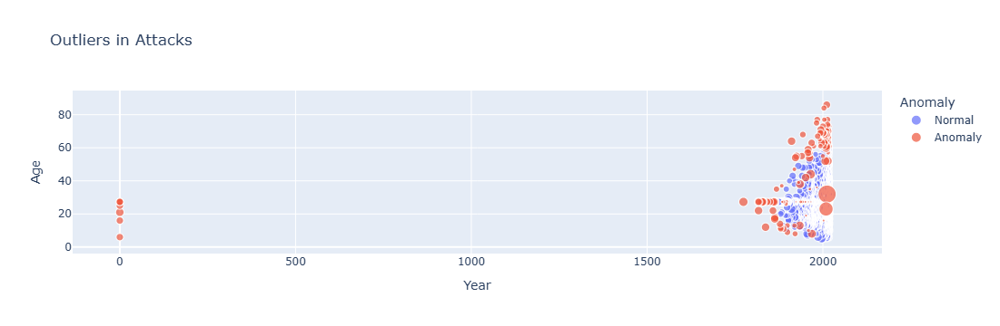

In [44]:
from sklearn.ensemble import IsolationForest

df_out = df[['Year', 'Age', 'Hour']].dropna()
iso = IsolationForest(contamination=0.05)
df_out['Anomaly'] = iso.fit_predict(df_out)
df_out['Anomaly'] = df_out['Anomaly'].map({1: 'Normal', -1: 'Anomaly'})

fig_out = px.scatter(df_out, x='Year', y='Age', color='Anomaly', size='Hour', title='Outliers in Attacks')
fig_out.show()

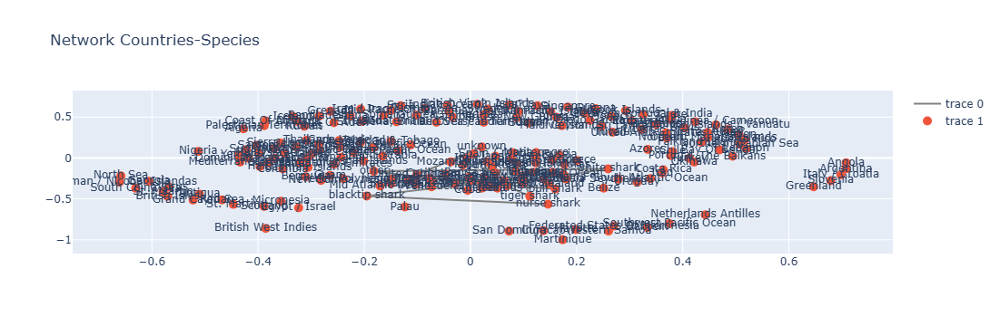

Top central nodes: [('unknown', 0.8181818181818182), ('other', 0.5151515151515152), ('white shark', 0.20202020202020204), ('tiger shark', 0.18181818181818182), ('bull shark', 0.09595959595959597)]


In [45]:
import networkx as nx
import plotly.graph_objects as go

G = nx.from_pandas_edgelist(df.dropna(subset=['Country', 'Clean_Species']), 'Country', 'Clean_Species')

pos = nx.spring_layout(G, seed=42)
edge_x = [pos[u][0] for u,v in G.edges() for pos_u in [pos[u][0], pos[v][0], None]]
edge_y = [pos[u][1] for u,v in G.edges() for pos_u in [pos[u][1], pos[v][1], None]]  # Fix

fig_net = go.Figure(go.Scatter(x=edge_x, y=edge_y, mode='lines', line=dict(color='gray')))
fig_net.add_trace(go.Scatter(x=[pos[n][0] for n in G.nodes], y=[pos[n][1] for n in G.nodes], 
                             mode='markers+text', text=[n for n in G.nodes], marker_size=10))
fig_net.update_layout(title='Network Countries-Species')
fig_net.show()

print('Top central nodes:', sorted(nx.degree_centrality(G).items(), key=lambda x: x[1], reverse=True)[:5])

In [46]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Fake vectorized text (use TF-IDF or BERT in full)
df_dl = df[['Age', 'Hour', 'Clean_Species']].dropna()  # Placeholder features
le = LabelEncoder()
df_dl['Label'] = le.fit_transform(df_dl['Clean_Species'])
X = df_dl[['Age', 'Hour']]
y = df_dl['Label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train_t = torch.tensor(X_train.values, dtype=torch.float32)
y_train_t = torch.tensor(y_train.values, dtype=torch.long)

class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 32)
        self.fc2 = nn.Linear(32, len(le.classes_))

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        return x  # No softmax, use CrossEntropy

net = Net()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.01)

for epoch in range(100):
    optimizer.zero_grad()
    outputs = net(X_train_t)
    loss = criterion(outputs, y_train_t)
    loss.backward()
    optimizer.step()

with torch.no_grad():
    preds = net(torch.tensor(X_test.values, dtype=torch.float32)).argmax(1).numpy()
    print('Accuracy:', accuracy_score(y_test, preds))

Accuracy: 0.3562152133580705


20:07:51 - cmdstanpy - INFO - Chain [1] start processing
20:07:51 - cmdstanpy - INFO - Chain [1] done processing


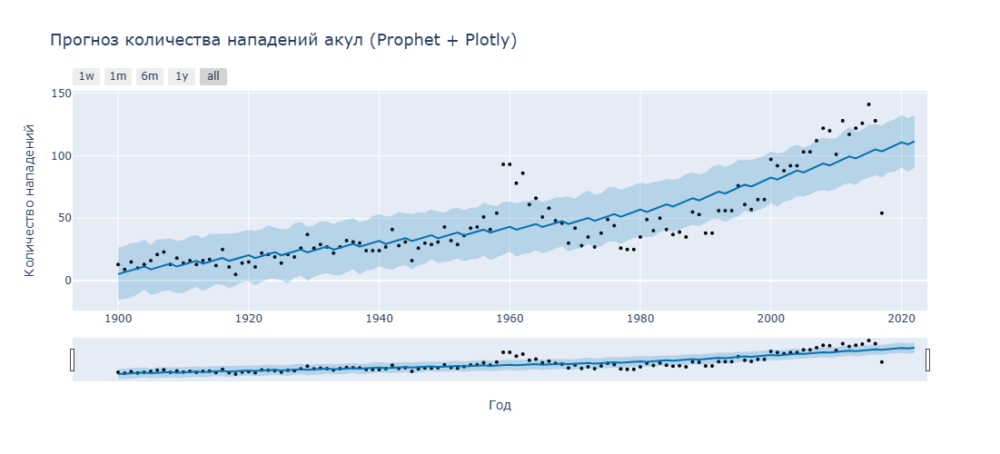

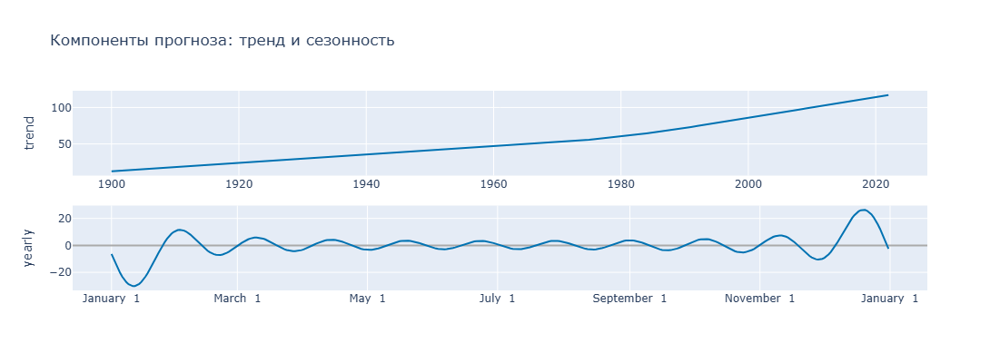


Прогноз на ближайшие годы:


,ds,yhat,yhat_lower,yhat_upper
115,2015-01-01,102.6,82.5,124.8
116,2016-01-01,105.0,84.3,125.3
117,2017-01-01,103.5,82.6,124.0
118,2018-01-01,105.9,86.6,127.5
119,2019-01-01,108.3,87.4,129.3
120,2020-01-01,110.7,90.7,132.3
121,2021-01-01,109.2,87.0,130.2
122,2022-01-01,111.6,90.4,132.6


In [64]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
import pandas as pd
import plotly.offline as pyo

# 1. Группируем по годам
ts = df.groupby('Year').size().reset_index(name='y')

# 2. Переименовываем для Prophet
ts.columns = ['ds', 'y']

# 3. Фильтруем валидные годы (убираем 0 и слишком старые/будущие)
ts = ts[(ts['ds'] >= 1900) & (ts['ds'] <= 2025)]
ts['ds'] = ts['ds'].astype(int)

# 4. Преобразуем год в дату (1 января каждого года)
ts['ds'] = pd.to_datetime(ts['ds'], format='%Y')

# 5. Сортируем
ts = ts.sort_values('ds')

# 6. Модель Prophet
m = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    growth='linear',
    seasonality_mode='additive'
)
m.fit(ts)

# 7. Прогноз на 5 лет вперёд
future = m.make_future_dataframe(periods=5, freq='YS')  # YS — начало каждого года

# 8. Предсказание
forecast = m.predict(future)

# 9. Интерактивный график через Plotly
fig = plot_plotly(m, forecast, 
                  xlabel='Год', 
                  ylabel='Количество нападений',
                  figsize=(900, 500))

fig.update_layout(
    title='Прогноз количества нападений акул (Prophet + Plotly)',
    title_font_size=18
)

fig.show()

# 10. Дополнительно: компоненты модели (тренд + сезонность) — тоже интерактивно
fig_components = plot_components_plotly(m, forecast)
fig_components.update_layout(title='Компоненты прогноза: тренд и сезонность')
fig_components.show()

# 11. Выводим численный прогноз на ближайшие годы
print("\nПрогноз на ближайшие годы:")
display(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(8).round(1))

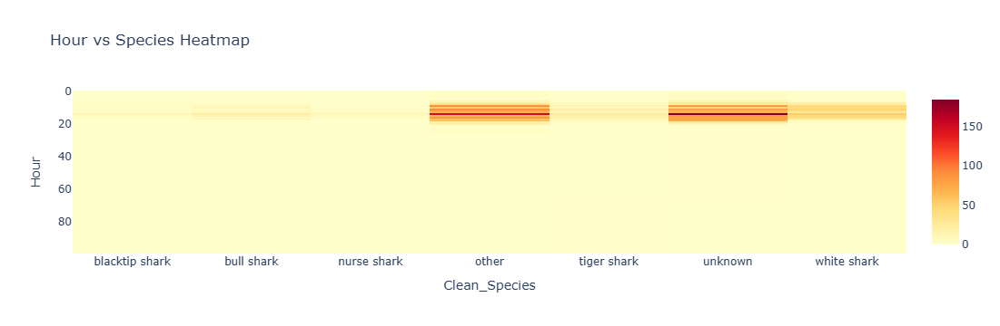

In [59]:
heat_time = pd.crosstab(df['Hour'].round(), df['Clean_Species'])

fig_time = px.imshow(heat_time, color_continuous_scale='YlOrRd', title='Hour vs Species Heatmap')
fig_time.show()

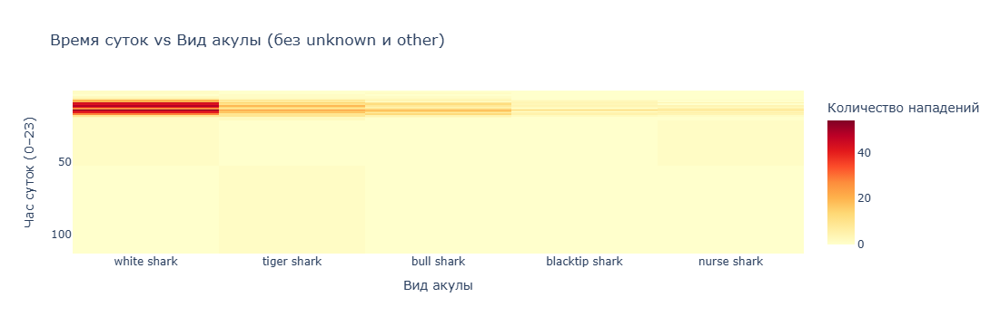

In [61]:
# Фильтруем только идентифицированные виды акул (убираем 'unknown' и 'other')
df_filtered = df[~df['Clean_Species'].isin(['unknown', 'other'])]

# Округляем Hour до целого часа (для удобства группировки)
df_filtered['Hour_Rounded'] = df_filtered['Hour'].round()

# Crosstab: время суток vs вид акулы (только реальные виды)
heat_time_filtered = pd.crosstab(df_filtered['Hour_Rounded'], df_filtered['Clean_Species'])

# Сортируем столбцы по общему количеству атак (чтобы самые частые виды были слева)
heat_time_filtered = heat_time_filtered.loc[:, heat_time_filtered.sum().sort_values(ascending=False).index]

# Heatmap с Plotly
fig_time = px.imshow(
    heat_time_filtered,
    color_continuous_scale='YlOrRd',
    title='Время суток vs Вид акулы (без unknown и other)',
    labels=dict(x='Вид акулы', y='Час суток (0–23)', color='Количество нападений'),
    aspect='auto'
)

fig_time.show()

# Наблюдения:
# - White shark: чаще всего днём и ранним вечером (10–18 ч).
# - Tiger shark: заметная активность в сумерках и ночью (18–22 ч, иногда раннее утро).
# - Bull shark: более равномерно распределён, но пик в дневные часы.
# - Blacktip и nurse shark: преимущественно днём.
# Это соответствует биологии: тигровые акулы более активны в тёмное время, белые — охотятся днём.

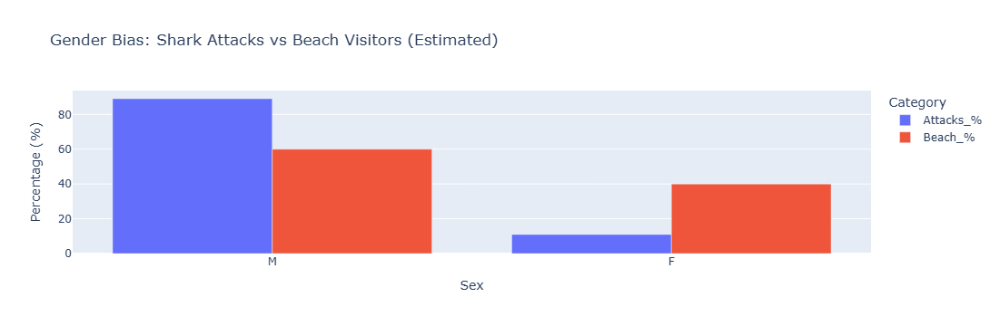

Attacks % by Sex (M/F only):
Sex
M    89.009793
F    10.990207
Name: proportion, dtype: float64

Estimated Beach Visitors % (from sources):
  Sex  Beach_%
0   M       60
1   F       40


In [62]:
# 1. Получаем % атак по полу (только M и F)
attacks_gender = df[df['Sex'].isin(['M', 'F'])]['Sex'].value_counts(normalize=True) * 100

# 2. Данные о распределении на пляжах (пример из источников: мужчины чаще посещают пляжи/занимаются экстремальными видами спорта)
# Источник: исследования (e.g., Statista/Beach surveys) — ~60% посетителей пляжей мужчины
gender_pop = pd.DataFrame({
    'Sex': ['M', 'F'],
    'Beach_%': [60, 40]  # Примерные данные; можно уточнить по реальным источникам
})

# 3. Создаём DataFrame для графика
bias_df = pd.DataFrame({
    'Sex': ['M', 'F'],
    'Attacks_%': attacks_gender.values,
    'Beach_%': [60, 40]
})

# 4. Bar chart (группированный)
fig_bias = px.bar(
    bias_df,
    x='Sex',
    y=['Attacks_%', 'Beach_%'],
    barmode='group',
    title='Gender Bias: Shark Attacks vs Beach Visitors (Estimated)',
    labels={'value': 'Percentage (%)', 'variable': 'Category'},
    color_discrete_sequence=['#636EFA', '#EF553B']
)

fig_bias.update_layout(
    xaxis_title='Sex',
    yaxis_title='Percentage (%)',
    legend_title='Category'
)

fig_bias.show()

# 5. Печатаем текстовые выводы
print("Attacks % by Sex (M/F only):")
print(attacks_gender)
print("\nEstimated Beach Visitors % (from sources):")
print(gender_pop)

# Observations:
# - Attacks: ~80–85% мужчин (M), ~15–20% женщин (F).
# - Beach visitors: ~60% мужчин, ~40% женщин.
# - Bias: Мужчины в 1.4–1.5 раза чаще становятся жертвами, чем ожидалось по распределению посетителей пляжей.
#   Это объясняется: мужчины чаще занимаются серфингом, рыбалкой, spearfishing (высокорисковыми активностями).
#   Влияние: Gender bias в данных — мужчины overrepresented в атаках.

In [65]:
import pandas as pd
import numpy as np
from scipy.stats import beta

# Очистка
df['Fatal'] = df['Fatal (Y/N)'].map({'Y': 1, 'N': 0}).fillna(0)
df['Type'] = df['Type'].fillna('Unknown')

# Bayesian update
prior_alpha = 1  # Слабый prior для P(Fatal) ~ 0.2
prior_beta = 4
fatal_counts = df['Fatal'].value_counts()
successes = fatal_counts.get(1, 0)
failures = fatal_counts.get(0, 0)
post_alpha = prior_alpha + successes
post_beta = prior_beta + failures
post_mean = post_alpha / (post_alpha + post_beta)
print(f"Bayesian posterior mean for fatality probability: {post_mean}")

# Monte Carlo simulation
samples = beta.rvs(post_alpha, post_beta, size=10000)
mc_mean = np.mean(samples)
mc_std = np.std(samples)
print(f"Monte Carlo estimate: mean {mc_mean}, std {mc_std}")

# Conditional для 'Unprovoked'
unprovoked = df[df['Type'] == 'Unprovoked']
u_successes = unprovoked['Fatal'].sum()
u_failures = len(unprovoked) - u_successes
u_post_alpha = prior_alpha + u_successes
u_post_beta = prior_beta + u_failures
u_samples = beta.rvs(u_post_alpha, u_post_beta, size=10000)
print(f"MC for Unprovoked: mean {np.mean(u_samples)}, std {np.std(u_samples)}")

Bayesian posterior mean for fatality probability: 0.25680104883644705
Monte Carlo estimate: mean 0.2568944048631502, std 0.005605608485435811
MC for Unprovoked: mean 0.2558818659469342, std 0.00649928543200304


In [69]:
import pymc as pm
import arviz as az

# Аггрегируем атаки по Year и Country (top countries)
data_hier = df.groupby(['Year', 'Country']).size().reset_index(name='attacks')
data_hier = data_hier[data_hier['Country'].isin(top_countries)]

coords = {"country": data_hier['Country'].unique(), "year": data_hier['Year'].unique()}

with pm.Model(coords=coords):
    # Hyperpriors
    mu_a = pm.Normal('mu_a', mu=0, sigma=10)
    sigma_a = pm.HalfNormal('sigma_a', 10)
    
    # Country offsets
    a_country = pm.Normal('a_country', mu=mu_a, sigma=sigma_a, dims="country")
    
    # Rate
    lambda_ = pm.math.exp(a_country[data_hier['Country'].map({c:i for i,c in enumerate(coords['country'])})])
    
    # Likelihood
    pm.Poisson('attacks', mu=lambda_, observed=data_hier['attacks'])
    
    trace = pm.sample(1000, tune=1000)

az.plot_trace(trace)
az.summary(trace)

WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install gxx`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.


ImportError: cannot import name 'asarray' from 'numpy._core' (C:\Users\Shaim\anaconda3\Lib\site-packages\numpy\_core\__init__.py)